## To-do list
* Some cohort exploration based on deletion of subjects

* Look at variable correlations & clustering (if possible) -- suspect eg that systolic/diastolic will cluster based on prev work & means we can get away with using a variable score or one but not the other

* Create initial kitchen-sink model(s)
    * Identifier variables: ruid, visit_id, admit_date, discharge_date
    * Outcome variables: **readmit_30d**, readmit_time
    * Fixed effects (initially): ICD9, CPTs, medications, race, stay length, sex, DOB/age, pregnancy indicator, bmi
    * Random effects (initially): labs, number of transfers
    * Try as both: # transfers, stay length
    
    
* Do one model with all fixed effects first

* Model checking!!

In [23]:
X = df[['readmit_30d'] + final_var + ['group']]

In [5]:
list(df.columns)

['ruid',
 'visit_id',
 'admit_date',
 'discharge_date',
 'stay_length',
 'n_transfers',
 'readmit_time',
 'readmit_30d',
 'sex',
 'dob',
 'dod',
 'race',
 'cpt_anesthesia',
 'cpt_eval_manage',
 'cpt_expired',
 'cpt_medicine',
 'cpt_modifier',
 'cpt_path_lab',
 'cpt_radiology',
 'cpt_surgery',
 'cpt_unknown',
 'icd_dx_blood',
 'icd_dx_circulatory',
 'icd_dx_congenital',
 'icd_dx_digestive',
 'icd_dx_endocrine',
 'icd_dx_external',
 'icd_dx_gu',
 'icd_dx_infection',
 'icd_dx_injury',
 'icd_dx_mental',
 'icd_dx_muscskel',
 'icd_dx_neoplasm',
 'icd_dx_nervous',
 'icd_dx_obstetric',
 'icd_dx_perinatal',
 'icd_dx_respiratory',
 'icd_dx_skin',
 'icd_dx_symptoms',
 'icd_proc',
 'icd_visit',
 'med_Antihypertensive Agents',
 'med_Analgesics, Opioid',
 'med_Narcotics',
 'med_Antipyretics',
 'med_Anti-Bacterial Agents',
 'med_Anti-Inflammatory Agents, Non-Steroidal',
 'med_Analgesics, Non-Narcotic',
 'med_Antiemetics',
 'med_Diuretics',
 'med_Anti-Arrhythmia Agents',
 'med_Anti-Allergic Agents',
 

In [3]:
df = pd.read_csv('../data/merged.csv', parse_dates=['admit_date','discharge_date','dob','dod'])

In [4]:
df.head()

,ruid,visit_id,admit_date,discharge_date,stay_length,n_transfers,readmit_time,readmit_30d,sex,dob,...,lab_diastolic_median,lab_systolic_5p,lab_diastolic_5p,lab_systolic_95p,lab_diastolic_95p,lab_systolic_std,lab_diastolic_std,age,total_encounters,group
0,50135262,0,2007-02-08,2007-02-12,4,2,172 days 00:00:00.000000000,0,F,1949-09-20,...,58.0,107.0,44.0,186.0,77.0,20.263715,9.868120,57.385352,10,train
1,50135262,1,2007-08-03,2007-08-06,3,3,22 days 00:00:00.000000000,1,F,1949-09-20,...,61.0,106.0,50.0,146.0,74.0,12.518349,8.314473,57.867214,10,train
2,50135262,2,2007-08-28,2007-08-29,1,1,179 days 00:00:00.000000000,0,F,1949-09-20,...,60.0,108.0,42.0,188.0,82.0,25.989675,10.976472,57.935661,10,train
3,50135262,3,2008-02-24,2008-02-28,4,2,44 days 00:00:00.000000000,0,F,1949-09-20,...,74.0,116.0,59.9,165.0,88.0,15.661763,7.936733,58.428474,10,train
4,50135262,4,2008-04-12,2008-04-13,1,1,928 days 00:00:00.000000000,0,F,1949-09-20,...,66.0,122.0,56.0,158.0,88.0,11.855141,11.269165,58.559890,10,train


In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pymc3 as pm
import bambi as bm
sns.set()

from sklearn import preprocessing, model_selection
from sklearn.metrics import make_scorer, confusion_matrix, f1_score, roc_auc_score

In [146]:
import warnings
warnings.filterwarnings("ignore", module="mkl_fft")
warnings.filterwarnings("ignore", module="matplotlib")

In [166]:
df = pd.read_csv('../data/merged.csv', parse_dates=['admit_date','discharge_date','dob','dod'])

In [167]:
hosp_dates = df.admit_date.dt
birthdays = df.dob.dt

# df['age'] = [hosp_dates.year - birthdays.year + ((hosp_dates.month < birthdays.month) & (hosp_dates.day < birthdays.day))]
times = zip(hosp_dates.year,hosp_dates.month,hosp_dates.day,birthdays.year,birthdays.month,birthdays.day)
df['age'] = [hyear - byear + ((hmon, hday) < (bmon, bday)) for (hyear,hmon,hday,byear,bmon,bday) in times]

In [168]:
df.sex = (df.sex == 'M')*1
df.race = df.race.astype('category')

In [191]:
df[df.readmit_30d.isna()]

,ruid,visit_id,admit_date,discharge_date,stay_length,n_transfers,readmit_time,readmit_30d,sex,dob,...,k,na,pcv,plt-ct,systolic,diastolic,bmi,pregnancy_indicator,egfr,age


In [7]:
df.shape

(21041, 67)

In [8]:
df.columns

Index(['ruid', 'visit_id', 'admit_date', 'discharge_date', 'stay_length',
       'n_transfers', 'readmit_time', 'readmit_30d', 'sex', 'dob', 'dod',
       'race', 'cpt_anesthesia', 'cpt_eval_manage', 'cpt_expired',
       'cpt_medicine', 'cpt_modifier', 'cpt_path_lab', 'cpt_radiology',
       'cpt_surgery', 'cpt_unknown', 'icd_dx_blood', 'icd_dx_circulatory',
       'icd_dx_congenital', 'icd_dx_digestive', 'icd_dx_endocrine',
       'icd_dx_external', 'icd_dx_gu', 'icd_dx_infection', 'icd_dx_injury',
       'icd_dx_mental', 'icd_dx_muscskel', 'icd_dx_neoplasm', 'icd_dx_nervous',
       'icd_dx_obstetric', 'icd_dx_perinatal', 'icd_dx_respiratory',
       'icd_dx_skin', 'icd_dx_symptoms', 'icd_proc', 'icd_visit',
       'med_Antihypertensive Agents', 'med_Analgesics, Opioid',
       'med_Narcotics', 'med_Antipyretics', 'med_Anti-Bacterial Agents',
       'med_Anti-Inflammatory Agents, Non-Steroidal',
       'med_Analgesics, Non-Narcotic', 'med_Antiemetics', 'med_Diuretics',
       'med_A

In [11]:
labs = ['bun', 'co2', 'cl', 'creat', 'glubed',
       'gluc', 'k', 'na', 'pcv', 'plt-ct', 'systolic', 'diastolic', 'egfr']

demo = ['sex', 'age', 'bmi', 'pregnancy_indicator', 'race']

visit = ['stay_length', 'n_transfers', 'cpt_anesthesia', 'cpt_eval_manage', 'cpt_expired',
       'cpt_medicine', 'cpt_modifier', 'cpt_path_lab', 'cpt_radiology',
       'cpt_surgery', 'cpt_unknown']

diagnosis = ['icd_dx_blood', 'icd_dx_circulatory',
       'icd_dx_congenital', 'icd_dx_digestive', 'icd_dx_endocrine',
       'icd_dx_external', 'icd_dx_gu', 'icd_dx_infection', 'icd_dx_injury',
       'icd_dx_mental', 'icd_dx_muscskel', 'icd_dx_neoplasm', 'icd_dx_nervous',
       'icd_dx_obstetric', 'icd_dx_perinatal', 'icd_dx_respiratory',
       'icd_dx_skin', 'icd_dx_symptoms', 'icd_proc', 'icd_visit']

meds = ['med_Antihypertensive Agents', 'med_Analgesics, Opioid',
       'med_Narcotics', 'med_Antipyretics', 'med_Anti-Bacterial Agents',
       'med_Anti-Inflammatory Agents, Non-Steroidal',
       'med_Analgesics, Non-Narcotic', 'med_Antiemetics', 'med_Diuretics',
       'med_Anti-Arrhythmia Agents']

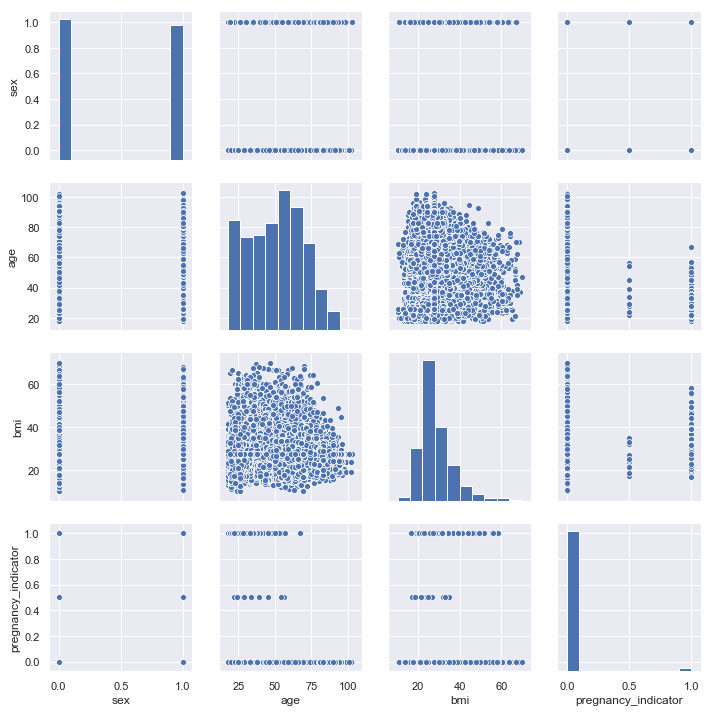

In [9]:
sns.pairplot(df[demo]);

In [10]:
df[((df.sex == 1) & (df.pregnancy_indicator == 1)) | ((df.sex == 1) & (df.pregnancy_indicator == 1)).shift() | ((df.sex == 1) & (df.pregnancy_indicator == 1)).shift(-1)]

,ruid,visit_id,admit_date,discharge_date,stay_length,n_transfers,readmit_time,readmit_30d,sex,dob,...,k,na,pcv,plt-ct,systolic,diastolic,bmi,pregnancy_indicator,egfr,age
2282,53728500,0,2006-05-06,2006-05-09,3 days 00:00:00.000000000,1,9999 days 00:00:00.000000000,0,0,1943-07-18,...,3.40,138.5,39.5,191.5,130.0,70.0,22.260,0.0,97.308400,64
2283,53728502,0,2004-10-28,2004-11-02,5 days 00:00:00.000000000,1,78 days 00:00:00.000000000,0,1,1949-10-25,...,4.10,136.0,35.0,323.0,126.0,66.0,36.800,1.0,99.935990,55
2284,53728502,1,2005-01-19,2005-01-26,7 days 00:00:00.000000000,5,307 days 00:00:00.000000000,0,1,1949-10-25,...,3.70,131.5,28.0,274.0,126.0,66.0,36.800,1.0,11.323180,57
2285,53728502,2,2005-11-29,2005-12-02,3 days 00:00:00.000000000,1,26 days 00:00:00.000000000,1,1,1949-10-25,...,4.30,137.0,28.0,294.0,128.0,70.0,33.970,0.5,45.307285,56
5965,53730004,5,2010-01-05,2010-01-08,3 days 00:00:00.000000000,1,54 days 00:00:00.000000000,0,1,1972-05-05,...,4.95,139.5,35.0,404.0,140.5,80.0,21.950,0.0,4.885000,39
5966,53730004,6,2010-03-03,2010-03-08,5 days 00:00:00.000000000,3,26 days 00:00:00.000000000,1,1,1972-05-05,...,4.55,138.0,35.0,160.0,111.0,66.0,22.095,1.0,7.252745,39
5967,53730004,7,2010-04-03,2010-04-28,25 days 00:00:00.000000000,17,11 days 00:00:00.000000000,1,1,1972-05-05,...,3.95,137.0,26.0,623.0,127.0,75.0,20.980,1.0,13.350000,39
5968,53730004,8,2010-05-09,2010-05-15,6 days 00:00:00.000000000,4,19 days 00:00:00.000000000,1,1,1972-05-05,...,4.40,139.0,36.5,349.0,122.0,80.0,22.020,0.0,13.653300,38
5969,53730004,9,2010-06-03,2010-06-24,21 days 00:00:00.000000000,15,32 days 00:00:00.000000000,0,1,1972-05-05,...,4.20,139.0,31.0,414.0,120.0,76.0,22.670,1.0,15.670100,38
5970,53730004,10,2010-07-26,2010-07-29,3 days 00:00:00.000000000,4,9999 days 00:00:00.000000000,0,1,1972-05-05,...,4.95,137.5,40.0,288.0,138.0,81.0,21.940,1.0,20.870240,38


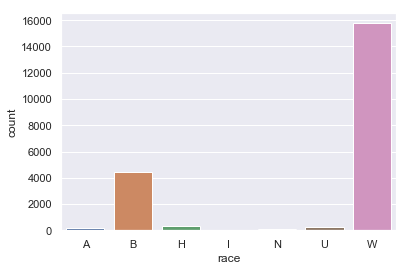

In [14]:
sns.countplot(df.race);

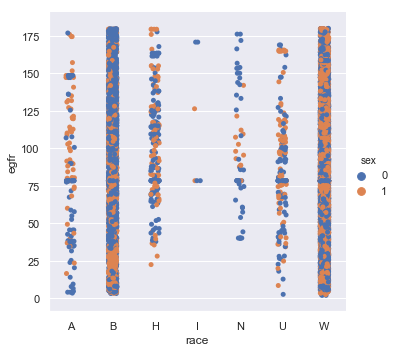

In [23]:
sns.catplot(x = 'race', y = 'egfr', hue='sex', data=df);

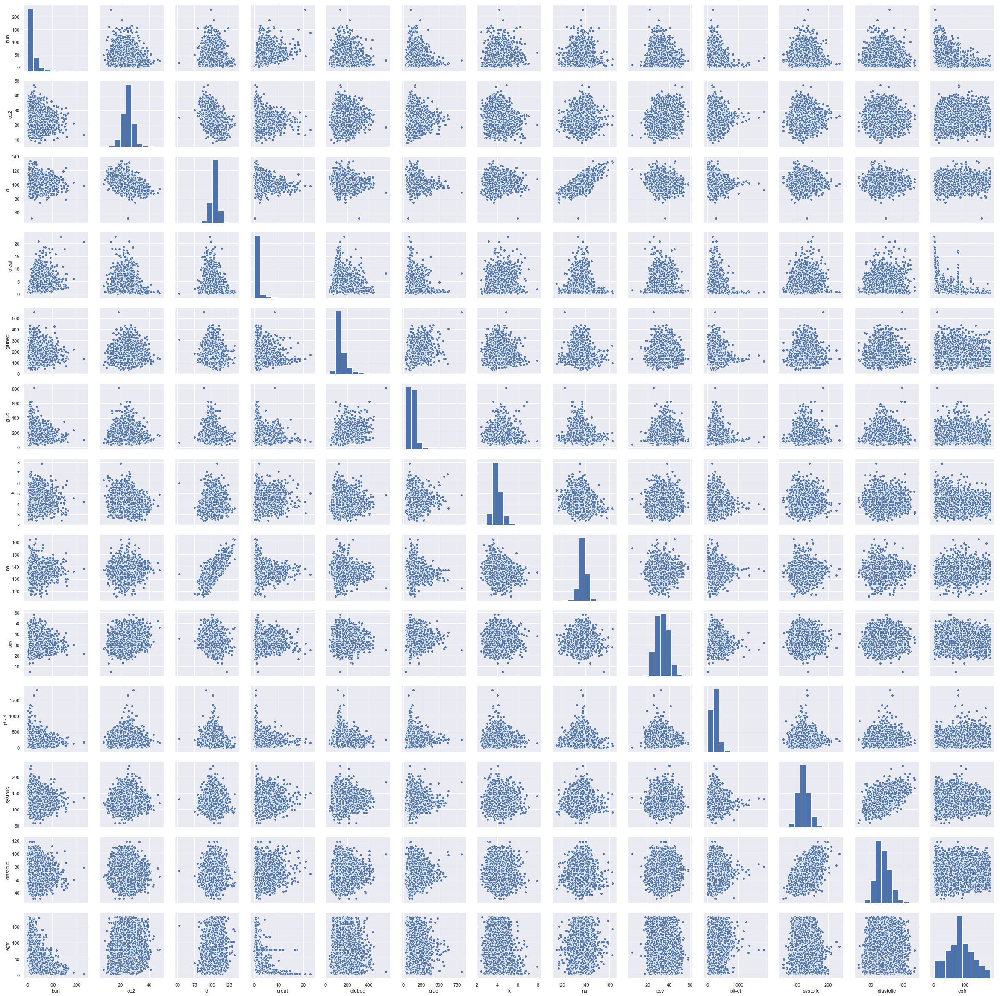

In [22]:
sns.pairplot(df[labs]);

In [25]:
# minimal_model = bm.Model(df)

# form = 'readmit_30d ~ ' + ' + '.join(demo)

# minimal_model.add('readmit_30d ~ 1')

# minimal_model.add(fixed = ' + '.join(demo))

In [107]:
y = df.readmit_30d[~(df.bmi.isna())]
X = df[~(df.bmi.isna())][demo]
X = pd.get_dummies(X)
X.loc[X.pregnancy_indicator.isna(),'pregnancy_indicator'] = 0
bmi = X.pop('bmi').values
bmi = bmi - np.nanmean(bmi)
X = X.values
X.shape

(18804, 10)

In [110]:
ruids = df.ruid.unique() # need to make this a dict for accessing repeated values somehow ... 
ruid_lookup = dict(zip(ruids, range(len(ruids))))
ruid = df['ruid_code'] = df.ruid.replace(ruid_lookup).values
ruid_red = ruid[~(df.bmi.isna())]
N = len(ruids)

In [56]:
np.sqrt(np.nanvar(bmi))

7.800283739906926

In [111]:
with pm.Model() as minimal_model:
    
    μ = pm.Normal("μ",0,sd=5)
    β = pm.Normal("β",0,sd=5,shape=X.shape[1])
    
    b_bmi = pm.Normal('b_bmi',0,10, shape = N)
    
    p = pm.invlogit(μ + β.dot(X.T) + b_bmi[ruid_red]*bmi)
    
    readmit_30d = pm.Bernoulli('30day_readmit', p=p, observed = y)

In [ ]:
    μ = pm.Normal("μ",0,sd=5)
    β = pm.Normal("β",0,sd=5,shape=X.shape[1])
    b_age = pm.Normal('b_age', 0, sd = 5)
    
    p = pm.invlogit(μ + β.dot(X.T) + b_age*age_imputed)
    
    survived = pm.Bernoulli('survived', p=p, observed=y)

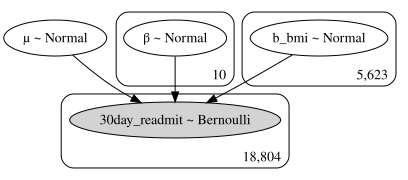

In [112]:
pm.model_to_graphviz(minimal_model)

In [113]:
with minimal_model:
    test_trace = pm.sample(200)

Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b_bmi, β, μ]
Sampling 2 chains: 100%|██████████| 1400/1400 [31:17<00:00,  1.35s/draws]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The number of effective samples is smaller than 10% for some parameters.


/Users/kkondratieff/anaconda/envs/bios8366/lib/python3.6/site-packages/matplotlib/axes/_base.py:3604: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')
/Users/kkondratieff/anaconda/envs/bios8366/lib/python3.6/site-packages/matplotlib/axes/_base.py:3604: MatplotlibDeprecationWarning: 
The `ymin` argument was deprecated in Matplotlib 3.0 and will be removed in 3.2. Use `bottom` instead.
  alternative='`bottom`', obj_type='argument')


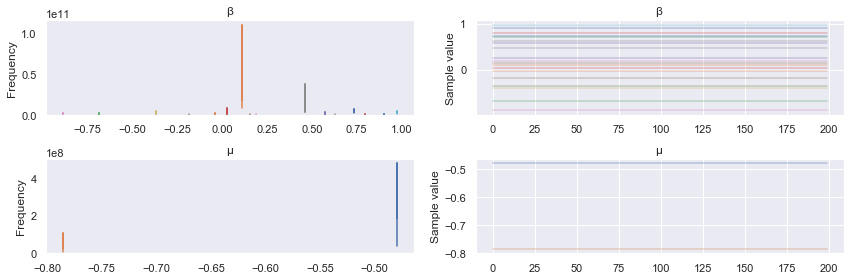

In [114]:
pm.traceplot(test_trace, varnames = ['β','μ']);

In [195]:
data = df[~(df.bmi.isna())][demo + ['readmit_30d']]
data = pd.get_dummies(data)
data.loc[data.pregnancy_indicator.isna(),'pregnancy_indicator'] = 0
data

,sex,age,bmi,pregnancy_indicator,readmit_30d,race_A,race_B,race_H,race_I,race_N,race_U,race_W
0,0,59,44.710,0.0,0,0,0,0,0,0,0,1
1,0,59,45.025,0.0,1,0,0,0,0,0,0,1
2,0,59,46.230,0.0,0,0,0,0,0,0,0,1
3,0,60,47.140,0.0,0,0,0,0,0,0,0,1
4,0,60,47.360,0.0,0,0,0,0,0,0,0,1
5,0,61,47.580,0.0,0,0,0,0,0,0,0,1
6,0,63,40.200,0.0,0,0,0,0,0,0,0,1
7,0,64,44.250,0.0,0,0,0,0,0,0,0,1
8,0,64,42.770,0.0,0,0,0,0,0,0,0,1
9,0,65,48.340,0.0,0,0,0,0,0,0,0,1


In [204]:
form = 'readmit_30d ~ ' + ' + '.join(data.columns[(data.columns != 'readmit_30d')])
form

'readmit_30d ~ sex + pregnancy_indicator + race_A + race_B + race_H + race_I + race_N + race_U + race_W + age_trns + bmi_trns'

In [142]:
with pm.Model() as fixed_effects:
    family = pm.glm.families.Binomial()
    pm.glm.GLM.from_formula(form,data,family=family)

In [143]:
for RV in fixed_effects.basic_RVs:
    print(RV.name, RV.logp(fixed_effects.test_point))

Intercept 0.0
sex -7.82669381218681
age -7.82669381218681
bmi -7.82669381218681
pregnancy_indicator -7.82669381218681
race_A -7.82669381218681
race_B -7.82669381218681
race_H -7.82669381218681
race_I -7.82669381218681
race_N -7.82669381218681
race_U -7.82669381218681
race_W -7.82669381218681
y -13033.939583251822


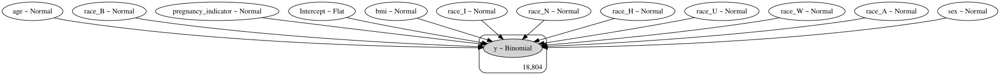

In [185]:
pm.model_to_graphviz(fixed_effects)

In [144]:
with fixed_effects:    
    
    trace = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [race_W, race_U, race_N, race_I, race_H, race_B, race_A, pregnancy_indicator, bmi, age, sex, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [27:19<00:00,  1.22draws/s]
The acceptance probability does not match the target. It is 0.5541887126793166, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.3983966404203111, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameter

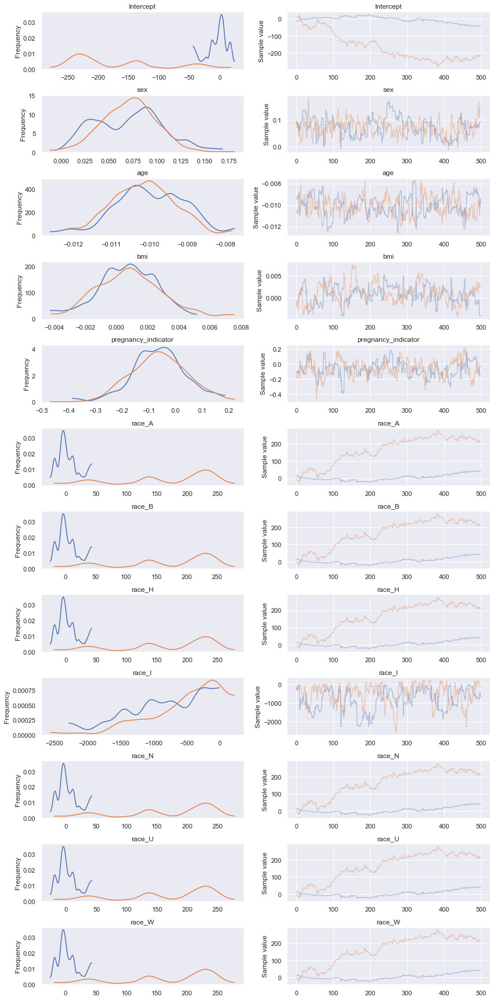

In [147]:
pm.traceplot(trace);

/Users/kkondratieff/anaconda/envs/bios8366/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


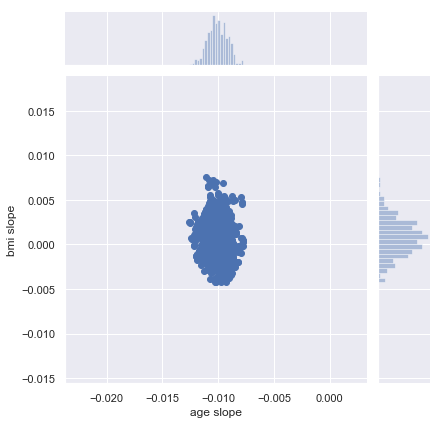

In [148]:
x = pd.Series(trace['age'], name='age slope')
y = pd.Series(trace['bmi'], name='bmi slope')

sns.jointplot(x, y);

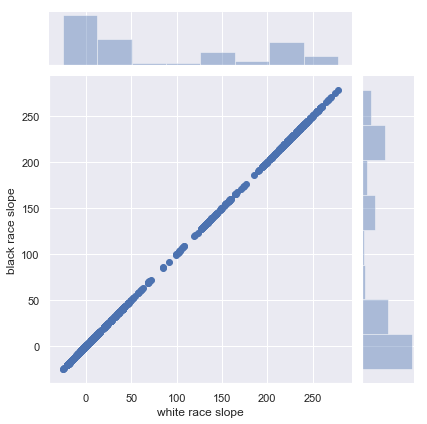

In [183]:
x = pd.Series(trace['race_W'], name='white race slope')
y = pd.Series(trace['race_B'], name='black race slope')

sns.jointplot(x, y);

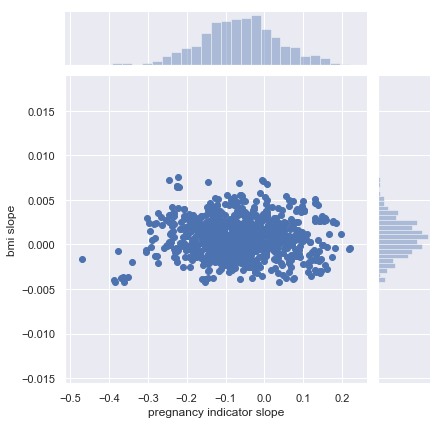

In [184]:
x = pd.Series(trace['pregnancy_indicator'], name='pregnancy indicator slope')
y = pd.Series(trace['bmi'], name='bmi slope')

sns.jointplot(x, y);

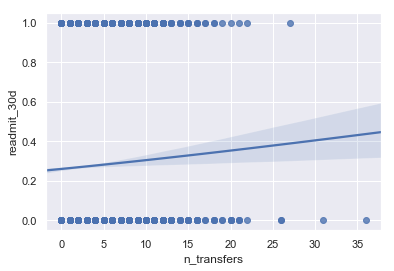

In [153]:
sns.regplot(x= 'n_transfers', y= 'readmit_30d', data= df, logistic= True);

In [152]:
df[demo].describe()

,sex,age,bmi,pregnancy_indicator
count,21041.000000,21041.000000,18804.000000,18804.000000
mean,0.490186,50.630816,28.709525,0.022681
std,0.499916,18.714957,7.800491,0.148398
min,0.000000,18.000000,10.130000,0.000000
25%,0.000000,35.000000,23.640000,0.000000
50%,0.000000,52.000000,27.510000,0.000000
75%,1.000000,64.000000,31.921250,0.000000
max,1.000000,103.000000,69.790000,1.000000


In [172]:
df_nooc = df.copy()

In [175]:
df_nooc = df_nooc.drop(["ruid","visit_id","admit_date","discharge_date",
                        "readmit_time","readmit_30d"], axis=1)

In [176]:
df_nooc.columns

Index(['stay_length', 'n_transfers', 'sex', 'dob', 'dod', 'race',
       'cpt_anesthesia', 'cpt_eval_manage', 'cpt_expired', 'cpt_medicine',
       'cpt_modifier', 'cpt_path_lab', 'cpt_radiology', 'cpt_surgery',
       'cpt_unknown', 'icd_dx_blood', 'icd_dx_circulatory',
       'icd_dx_congenital', 'icd_dx_digestive', 'icd_dx_endocrine',
       'icd_dx_external', 'icd_dx_gu', 'icd_dx_infection', 'icd_dx_injury',
       'icd_dx_mental', 'icd_dx_muscskel', 'icd_dx_neoplasm', 'icd_dx_nervous',
       'icd_dx_obstetric', 'icd_dx_perinatal', 'icd_dx_respiratory',
       'icd_dx_skin', 'icd_dx_symptoms', 'icd_proc', 'icd_visit',
       'med_Antihypertensive Agents', 'med_Analgesics, Opioid',
       'med_Narcotics', 'med_Antipyretics', 'med_Anti-Bacterial Agents',
       'med_Anti-Inflammatory Agents, Non-Steroidal',
       'med_Analgesics, Non-Narcotic', 'med_Antiemetics', 'med_Diuretics',
       'med_Anti-Arrhythmia Agents', 'bun', 'co2', 'cl', 'creat', 'glubed',
       'gluc', 'k', 'na', '

In [177]:
df_nooc.corr()

,n_transfers,sex,cpt_anesthesia,cpt_eval_manage,cpt_expired,cpt_medicine,cpt_modifier,cpt_path_lab,cpt_radiology,cpt_surgery,...,k,na,pcv,plt-ct,systolic,diastolic,bmi,pregnancy_indicator,egfr,age
n_transfers,1.000000,0.047886,0.150987,0.527980,0.388557,0.516122,0.470775,0.529798,0.514313,0.443901,...,0.023599,-0.018303,-0.154198,-0.018384,-0.014915,-0.076706,-0.000466,-0.011179,-0.089592,0.040431
sex,0.047886,1.000000,0.006868,0.030870,0.055642,0.038771,0.031728,0.064289,0.065720,0.020999,...,0.105486,-0.064349,0.153248,-0.085301,0.035123,0.106535,-0.080561,-0.142023,-0.024731,0.104008
cpt_anesthesia,0.150987,0.006868,1.000000,0.100183,0.252874,0.207113,0.176023,0.183514,0.234919,0.319142,...,0.015863,-0.010132,-0.058769,-0.029034,0.004889,-0.073669,-0.025069,-0.012050,-0.005693,0.109564
cpt_eval_manage,0.527980,0.030870,0.100183,1.000000,0.332184,0.682559,0.728851,0.837667,0.638824,0.468840,...,0.000513,-0.019261,-0.172019,-0.042126,-0.019100,-0.024088,-0.009953,-0.025710,-0.037803,0.004881
cpt_expired,0.388557,0.055642,0.252874,0.332184,1.000000,0.510643,0.503793,0.489340,0.591552,0.581316,...,-0.001966,-0.010779,-0.086101,0.049840,-0.013780,-0.055189,-0.004938,-0.021644,0.027312,0.034397
cpt_medicine,0.516122,0.038771,0.207113,0.682559,0.510643,1.000000,0.627251,0.771685,0.740324,0.580438,...,0.029237,0.021677,-0.086961,-0.016914,-0.003773,-0.083854,0.029258,-0.039660,-0.087846,0.106268
cpt_modifier,0.470775,0.031728,0.176023,0.728851,0.503793,0.627251,1.000000,0.807082,0.624444,0.520505,...,-0.011874,-0.018493,-0.191068,-0.047104,-0.029571,-0.026753,0.001562,-0.019599,0.009247,-0.031496
cpt_path_lab,0.529798,0.064289,0.183514,0.837667,0.489340,0.771685,0.807082,1.000000,0.751580,0.594678,...,0.011731,-0.032273,-0.204553,-0.092834,-0.026234,-0.051297,0.006624,-0.039664,-0.076070,0.041612
cpt_radiology,0.514313,0.065720,0.234919,0.638824,0.591552,0.740324,0.624444,0.751580,1.000000,0.668407,...,-0.001531,0.025137,-0.119114,-0.023320,0.003779,-0.053549,-0.006000,-0.040318,-0.018742,0.041591
cpt_surgery,0.443901,0.020999,0.319142,0.468840,0.581316,0.580438,0.520505,0.594678,0.668407,1.000000,...,0.021079,0.011567,-0.150859,-0.018395,-0.010180,-0.059847,0.011431,0.012507,0.001410,-0.006120


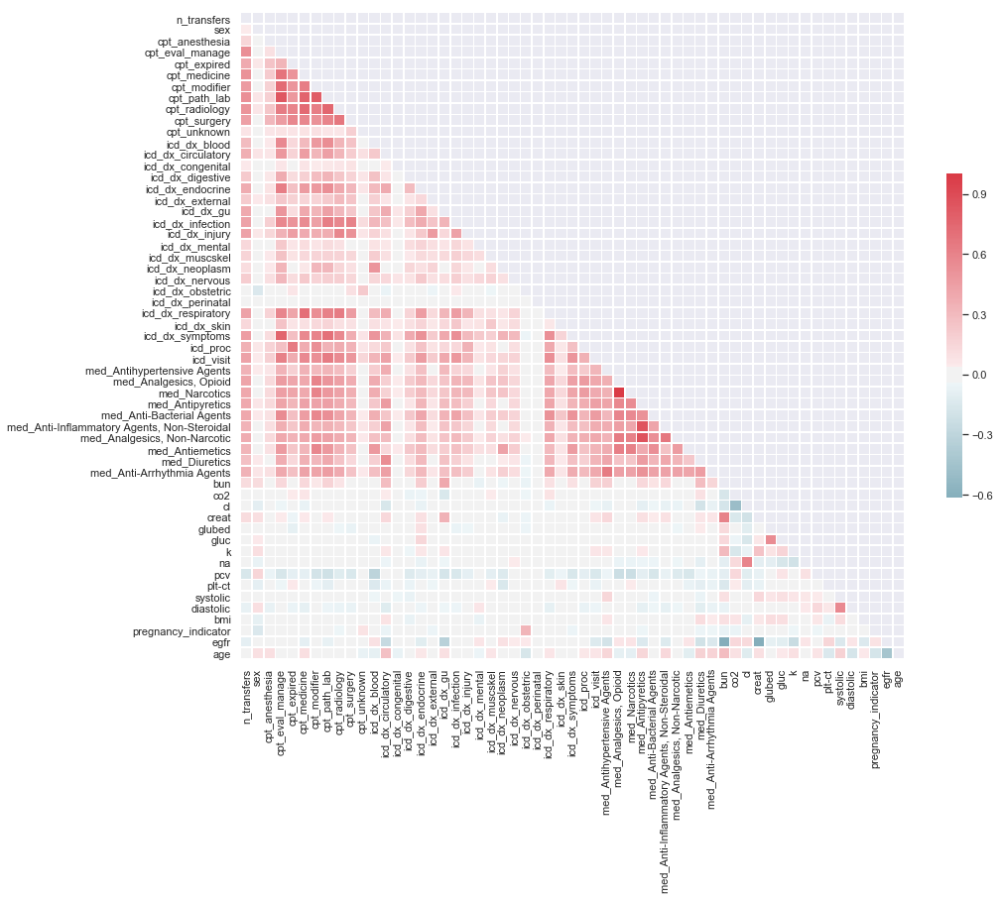

In [181]:
corr = df_nooc.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, center = 0);

In [203]:
scaler = preprocessing.StandardScaler()
scaler.fit(data[["age","bmi"]])
trns = scaler.transform(data[["age","bmi"]])
data['age_trns'] = trns.T[0]
data['bmi_trns'] = trns.T[1]

/Users/kkondratieff/anaconda/envs/bios8366/lib/python3.6/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/kkondratieff/anaconda/envs/bios8366/lib/python3.6/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until


In [204]:
form = 'readmit_30d ~ ' + ' + '.join(data.columns[(data.columns != 'readmit_30d')])
form

'readmit_30d ~ sex + pregnancy_indicator + race_A + race_B + race_H + race_I + race_N + race_U + race_W + age_trns + bmi_trns'

In [205]:
with pm.Model() as transformed_model:
    family = pm.glm.families.Binomial()
    pm.glm.GLM.from_formula(form,data,family=family)

In [207]:
for RV in transformed_model.basic_RVs:
    print(RV.name, RV.logp(transformed_model.test_point))

Intercept 0.0
sex -7.82669381218681
pregnancy_indicator -7.82669381218681
race_A -7.82669381218681
race_B -7.82669381218681
race_H -7.82669381218681
race_I -7.82669381218681
race_N -7.82669381218681
race_U -7.82669381218681
race_W -7.82669381218681
age_trns -7.82669381218681
bmi_trns -7.82669381218681
y -13033.939583251822


In [208]:
with transformed_model:
    trace = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [bmi_trns, age_trns, race_W, race_U, race_N, race_I, race_H, race_B, race_A, pregnancy_indicator, sex, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [29:33<00:00,  1.60s/draws]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.8791710688398203, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1c58f64fd0>,
      dtype=object)

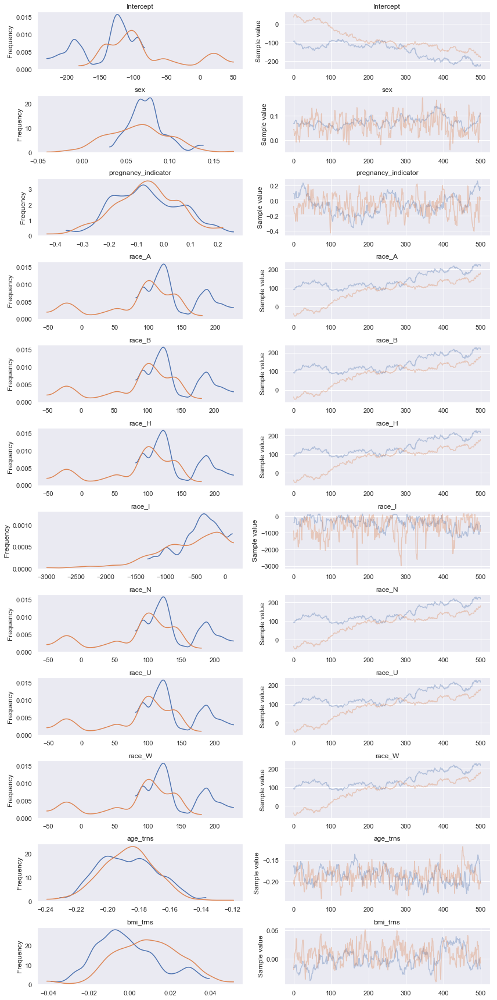

In [209]:
pm.traceplot(trace);

GridSpec(1, 2, width_ratios=[3, 1])

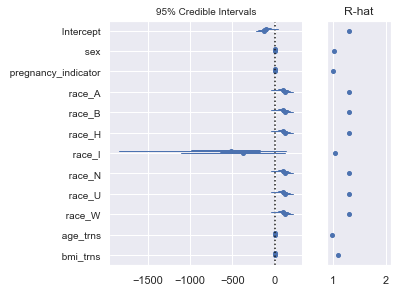

In [210]:
pm.forestplot(trace);

In [212]:
data_red = data[["readmit_30d","age_trns","bmi_trns","sex","pregnancy_indicator"]]

In [213]:
form = 'readmit_30d ~ ' + ' + '.join(data_red.columns[(data_red.columns != 'readmit_30d')])
form

'readmit_30d ~ age_trns + bmi_trns + sex + pregnancy_indicator'

In [214]:
with pm.Model() as reduced_model:
    family = pm.glm.families.Binomial()
    pm.glm.GLM.from_formula(form,data_red,family=family)
    
    trace_red = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [pregnancy_indicator, sex, bmi_trns, age_trns, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [00:31<00:00, 62.65draws/s]


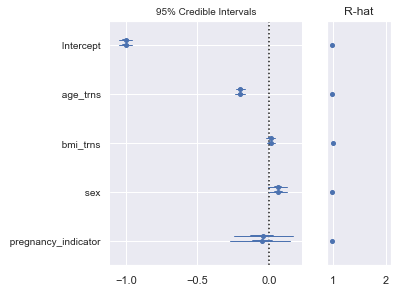

In [215]:
pm.forestplot(trace_red);

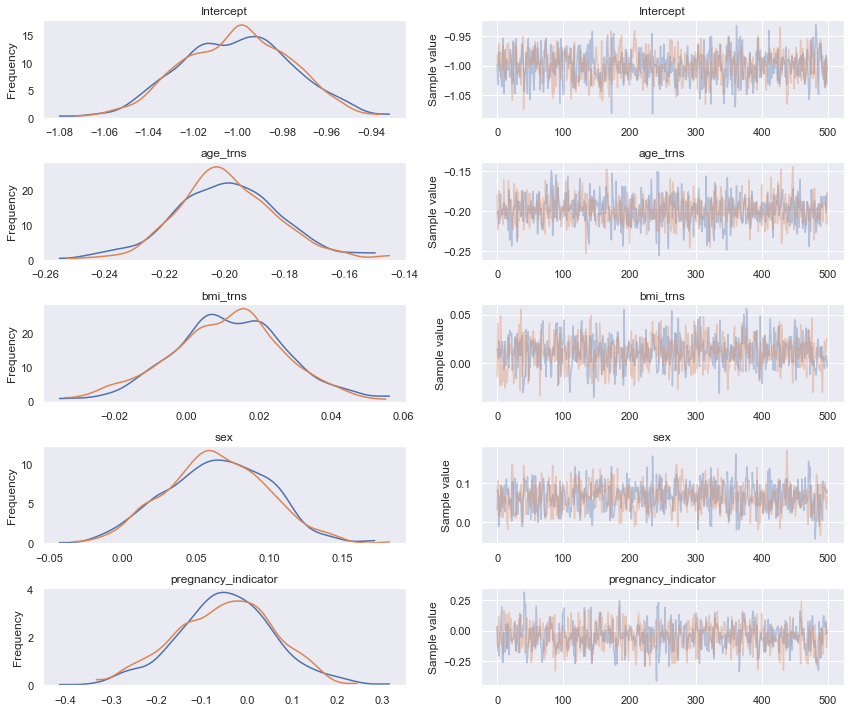

In [216]:
pm.traceplot(trace_red);

In [217]:
y = df.readmit_30d[~(df.bmi.isna())]
X = df[~(df.bmi.isna())][["age","bmi","pregnancy_indicator","sex"]]
X.loc[X.pregnancy_indicator.isna(),'pregnancy_indicator'] = 0
bmi = X.pop('bmi').values
bmi = bmi - np.nanmean(bmi)
X = X.values
X.shape

(18804, 3)

In [218]:
ruids = df.ruid.unique() # need to make this a dict for accessing repeated values somehow ... 
ruid_lookup = dict(zip(ruids, range(len(ruids))))
ruid = df['ruid_code'] = df.ruid.replace(ruid_lookup).values
ruid_red = ruid[~(df.bmi.isna())]
N = len(ruids)

In [220]:
with pm.Model() as minimal_model:
    
    μ = pm.Normal("μ",0,sd=5)
    β = pm.Normal("β",0,sd=5,shape=X.shape[1])
    
    b_bmi = pm.Normal('b_bmi',0,10, shape = N)
    
    p = pm.invlogit(μ + β.dot(X.T) + b_bmi[ruid_red]*bmi)
    
    readmit_30d = pm.Bernoulli('30day_readmit', p=p, observed = y)

In [221]:
with minimal_model:
    min_trace = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b_bmi, β, μ]
Sampling 2 chains: 100%|██████████| 2000/2000 [39:57<00:00,  1.80s/draws]
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.6676880653158436, but should be close to 0.8. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The gelman-rubin statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


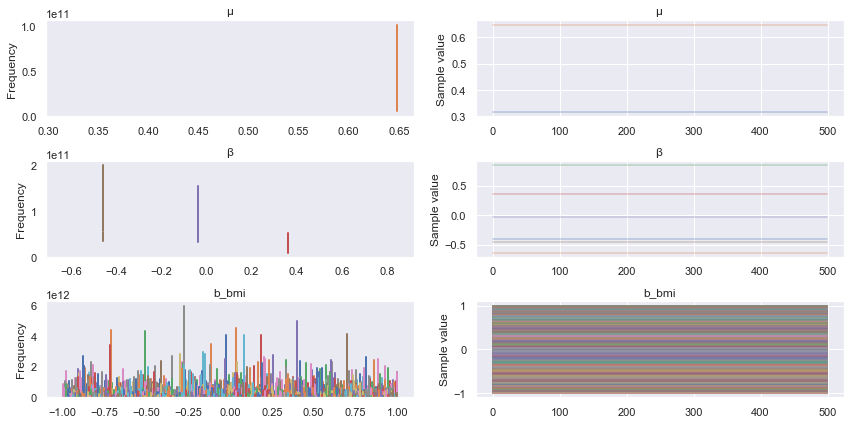

In [223]:
pm.traceplot(min_trace);

Okay I have to concede that the model hierarchical on patients just isn't going to work right; there's too many of them and not enough data to fit it.

GridSpec(1, 2, width_ratios=[3, 1])

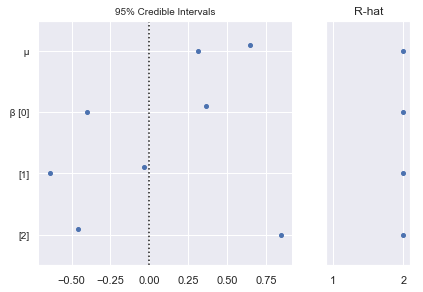

In [228]:
pm.forestplot(min_trace,varnames=['μ','β'])

## For a general modeling pipeline:
Need a utility function that:
1. Takes a DF and a list of variables,
2. Makes a GLM and samples from it,
3. Returns the trace.

Then need utility functions for:
1. Plotting chosen diagnostics.
2. Measuring the accuracy vs validation set.

Also do model comparisons using WAIC/LOO.

In [100]:
variables = demos + dx;
variables

['age',
 'sex',
 'icd_dx_blood',
 'icd_dx_circulatory',
 'icd_dx_congenital',
 'icd_dx_digestive',
 'icd_dx_endocrine',
 'icd_dx_external',
 'icd_dx_gu',
 'icd_dx_infection',
 'icd_dx_injury',
 'icd_dx_mental',
 'icd_dx_muscskel',
 'icd_dx_neoplasm',
 'icd_dx_nervous',
 'icd_dx_obstetric',
 'icd_dx_perinatal',
 'icd_dx_respiratory',
 'icd_dx_skin',
 'icd_dx_symptoms']

In [108]:
model_1, trace_1 = model_gen(variables = demos + dx, data = train_red, draws = 500)

logp = -6,786.1, ||grad|| = 6.3336: 100%|██████████| 104/104 [00:00<00:00, 388.69it/s] 
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [icd_dx_symptoms, icd_dx_skin, icd_dx_respiratory, icd_dx_perinatal, icd_dx_obstetric, icd_dx_nervous, icd_dx_neoplasm, icd_dx_muscskel, icd_dx_mental, icd_dx_injury, icd_dx_infection, icd_dx_gu, icd_dx_external, icd_dx_endocrine, icd_dx_digestive, icd_dx_congenital, icd_dx_circulatory, icd_dx_blood, sex, age, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [01:01<00:00, 32.28draws/s]


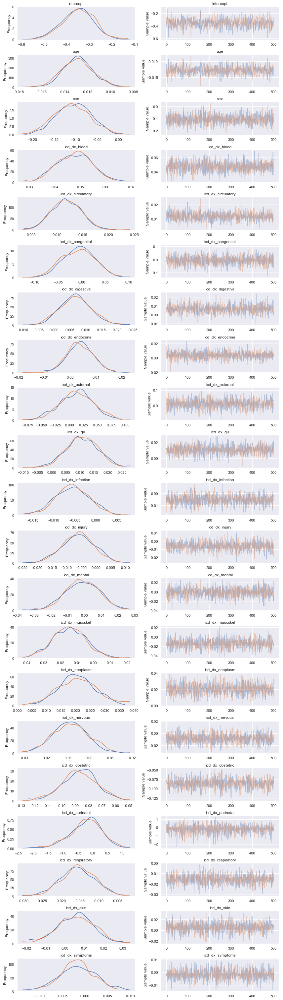

In [107]:
pm.traceplot(trace_1);

In [109]:
model_2, trace_2 = model_gen(variables = demos + dx + visit, data = train_red, draws = 500)

logp = -6,852.5, ||grad|| = 12.449: 100%|██████████| 386/386 [00:01<00:00, 349.64it/s] 
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [icd_visit, icd_proc, stay_length, n_transfers, cpt_unknown, cpt_surgery, cpt_radiology, cpt_path_lab, cpt_modifier, cpt_medicine, cpt_expired, cpt_eval_manage, cpt_anesthesia, icd_dx_symptoms, icd_dx_skin, icd_dx_respiratory, icd_dx_perinatal, icd_dx_obstetric, icd_dx_nervous, icd_dx_neoplasm, icd_dx_muscskel, icd_dx_mental, icd_dx_injury, icd_dx_infection, icd_dx_gu, icd_dx_external, icd_dx_endocrine, icd_dx_digestive, icd_dx_congenital, icd_dx_circulatory, icd_dx_blood, sex, age, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [01:46<00:00, 18.84draws/s]


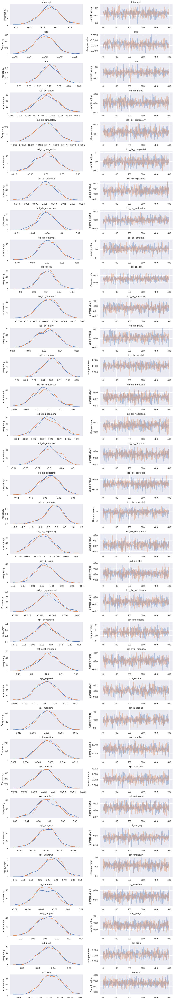

In [110]:
pm.traceplot(trace_2);

In [111]:
model_3, trace_3 = model_gen(variables = meds, data = train_red, draws = 500) # meds can't be fit -- it's basically a huge sparse matrix

logp = -8,342.4, ||grad|| = 76,071: 100%|██████████| 7/7 [00:00<00:00, 345.71it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [med_CardiotonicAgents, med_SerotoninAntagonists, med_BoneDensityConservationAgents, med_TocolyticAgents, med_Analgesics, med_AntifungalAgents, med_Angiotensin_ConvertingEnzymeInhibitors, med_AntitussiveAgents, med_Vitamins, med_SerotoninUptakeInhibitors, med_GABAModulators, med_DermatologicAgents, med_AntidepressiveAgentsSecond_Generation, med_Adrenergicbeta_1ReceptorAntagonists, med_ImmunosuppressiveAgents, med_AntipsychoticAgents, med_Anticonvulsants, med_HistamineH1Antagonists, med_AntineoplasticAgentsHormonal, med_CalciumChannelBlockers, med_PlateletAggregationInhibitors, med_SodiumPotassiumChlorideSymporterInhibitors, med_HypnoticsandSedatives, med_EnzymeInhibitors, med_HypoglycemicAgents, med_Sympatholytics, med_Anticoagulants, med_Glucocorticoids, med_Hydroxymethylglutaryl_

RuntimeError: Chain 0 failed.

In [112]:
model_4, trace_4 = model_gen(variables = demos + visit + dx + labs, data = train_red, draws = 500)

logp = -8,326.8, ||grad|| = 9.6747e+05: 100%|██████████| 7/7 [00:00<00:00, 348.55it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [egfr, pregnancy_indicator, bmi, diastolic, systolic, plt_ct, pcv, na, k, gluc, glubed, creat, cl, co2, bun, icd_dx_symptoms, icd_dx_skin, icd_dx_respiratory, icd_dx_perinatal, icd_dx_obstetric, icd_dx_nervous, icd_dx_neoplasm, icd_dx_muscskel, icd_dx_mental, icd_dx_injury, icd_dx_infection, icd_dx_gu, icd_dx_external, icd_dx_endocrine, icd_dx_digestive, icd_dx_congenital, icd_dx_circulatory, icd_dx_blood, icd_visit, icd_proc, stay_length, n_transfers, cpt_unknown, cpt_surgery, cpt_radiology, cpt_path_lab, cpt_modifier, cpt_medicine, cpt_expired, cpt_eval_manage, cpt_anesthesia, sex, age, Intercept]
Sampling 2 chains:   0%|          | 0/2000 [00:00<?, ?draws/s]


RuntimeError: Chain 0 failed.

In [113]:
model_5, trace_5 = model_gen(variables = labs, data = train_red, draws = 500)

logp = -8,068.5, ||grad|| = 9.5376e+05: 100%|██████████| 7/7 [00:00<00:00, 514.10it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [egfr, pregnancy_indicator, bmi, diastolic, systolic, plt_ct, pcv, na, k, gluc, glubed, creat, cl, co2, bun, Intercept]
Sampling 2 chains:   0%|          | 0/2000 [00:00<?, ?draws/s]


RuntimeError: Chain 0 failed.

In [114]:
labs_desc

,bun,co2,cl,creat,glubed,gluc,k,na,pcv,plt_ct,systolic,diastolic,bmi,pregnancy_indicator,egfr
count,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000,18804.000000
mean,19.511274,24.884346,104.493964,1.410427,144.504839,122.105749,3.971937,137.719581,33.137811,229.794964,121.991199,68.588385,28.709525,0.022681,83.618911
std,17.362938,3.535438,4.800415,1.612650,43.337725,45.693232,0.457484,3.187908,5.838563,112.507600,17.047002,10.926592,7.800491,0.148398,40.285738
min,1.000000,8.000000,52.000000,0.110000,40.000000,32.000000,2.400000,116.000000,5.000000,8.000000,58.000000,31.000000,10.130000,0.000000,1.996635
25%,9.000000,23.000000,102.000000,0.720000,121.000000,96.500000,3.700000,136.000000,29.000000,161.000000,110.000000,61.000000,23.640000,0.000000,56.183870
50%,14.000000,25.000000,105.000000,0.930000,135.000000,110.000000,3.900000,138.000000,33.000000,216.000000,120.000000,68.000000,27.510000,0.000000,78.427090
75%,23.000000,27.000000,107.000000,1.320000,155.000000,131.000000,4.200000,139.500000,37.000000,282.000000,132.000000,75.000000,31.921250,0.000000,110.180025
max,228.500000,47.000000,134.000000,22.840000,556.000000,812.000000,7.900000,162.500000,58.000000,1811.000000,234.000000,119.000000,69.790000,1.000000,179.960000


In [116]:
labs[:-2]

['bun',
 'co2',
 'cl',
 'creat',
 'glubed',
 'gluc',
 'k',
 'na',
 'pcv',
 'plt_ct',
 'systolic',
 'diastolic',
 'bmi']

In [117]:
model_6, trace_6 = model_gen(variables = labs[:-2], data = train_red, draws = 500)

logp = -8,052.8, ||grad|| = 9.3368e+05: 100%|██████████| 7/7 [00:00<00:00, 634.80it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [bmi, diastolic, systolic, plt_ct, pcv, na, k, gluc, glubed, creat, cl, co2, bun, Intercept]
Sampling 2 chains:   0%|          | 0/2000 [00:00<?, ?draws/s]


RuntimeError: Chain 0 failed.

In [119]:
scaler = preprocessing.StandardScaler()

In [143]:
X = train_red[labs]
X.shape
# scaler.fit(X)
# train_labsonly = pd.DataFrame([scaler.transform(X).T,train_red.readmit_30d],columns=[labs + ['readmit_30d']])

(11471, 15)

In [142]:
labsonly = pd.DataFrame(scaler.transform(X),columns = labs)

In [146]:
y = train_red.readmit_30d.reset_index(drop = True)

In [148]:
labsonly['readmit_30d'] = y

In [149]:
model_trans, trace_trans = model_gen(variables = labs, data = labsonly, draws = 500)

logp = -6,685, ||grad|| = 3.0233: 100%|██████████| 18/18 [00:00<00:00, 299.43it/s]  
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [egfr, pregnancy_indicator, bmi, diastolic, systolic, plt_ct, pcv, na, k, gluc, glubed, creat, cl, co2, bun, Intercept]
Sampling 2 chains: 100%|██████████| 2000/2000 [00:21<00:00, 94.03draws/s]


In [ ]:
def test_bayesian_glm():
    pass

In [150]:
Z = train_red[meds]
scaler.fit(Z)
medsonly = pd.DataFrame(scaler.transform(Z), columns = meds)

In [151]:
medsonly['readmit_30d'] = y

In [152]:
model_meds_trans, trace_meds_trans = model_gen(variables = meds, data = medsonly, draws = 500)

logp = -8,342.4, ||grad|| = 3,119.7: 100%|██████████| 4/4 [00:00<00:00, 291.31it/s]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [med_CardiotonicAgents, med_SerotoninAntagonists, med_BoneDensityConservationAgents, med_TocolyticAgents, med_Analgesics, med_AntifungalAgents, med_Angiotensin_ConvertingEnzymeInhibitors, med_AntitussiveAgents, med_Vitamins, med_SerotoninUptakeInhibitors, med_GABAModulators, med_DermatologicAgents, med_AntidepressiveAgentsSecond_Generation, med_Adrenergicbeta_1ReceptorAntagonists, med_ImmunosuppressiveAgents, med_AntipsychoticAgents, med_Anticonvulsants, med_HistamineH1Antagonists, med_AntineoplasticAgentsHormonal, med_CalciumChannelBlockers, med_PlateletAggregationInhibitors, med_SodiumPotassiumChlorideSymporterInhibitors, med_HypnoticsandSedatives, med_EnzymeInhibitors, med_HypoglycemicAgents, med_Sympatholytics, med_Anticoagulants, med_Glucocorticoids, med_Hydroxymethylglutaryl

RuntimeError: Chain 0 failed.

In [170]:
pd.DataFrame({'Rhat': gelman_rubin(full_trace)})

,Rhat
Intercept,0.999751
age,0.999784
bmi_last,1.000100
cpt_anesthesia,0.999752
cpt_eval_manage,0.999762
cpt_expired,0.999818
cpt_medicine,0.999836
cpt_modifier,0.999851
cpt_path_lab,0.999824
cpt_radiology,0.999984


In [ ]:
# model diagnostics
def model_diagnostics():
    pass

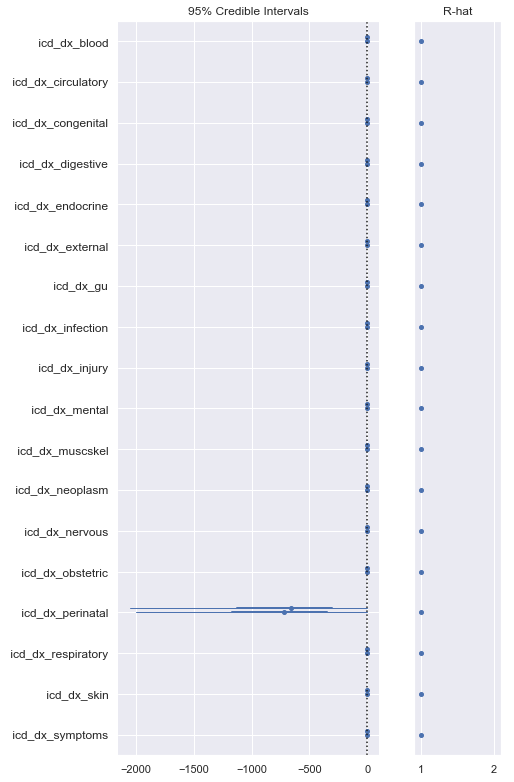

In [87]:
forestplot(full_trace, varnames=dx);

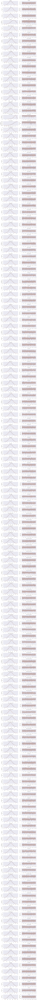

In [98]:
traceplot(full_trace);

In [90]:
X.icd_dx_perinatal.value_counts() # worth worrying about -- may want to remove this

0.0    21119
1.0       11
4.0        2
2.0        1
Name: icd_dx_perinatal, dtype: int64

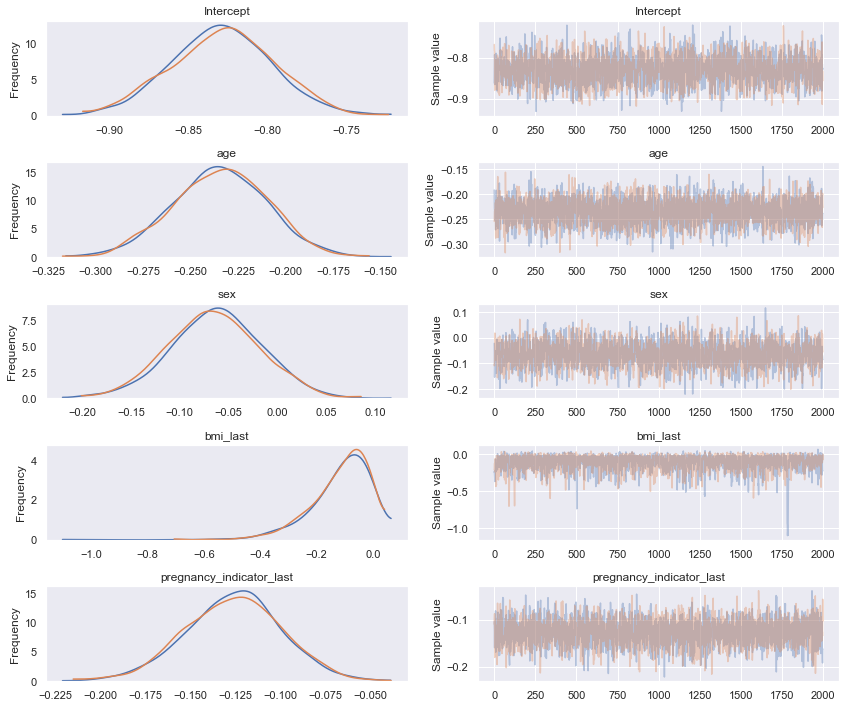

In [86]:
traceplot(simple_trace);

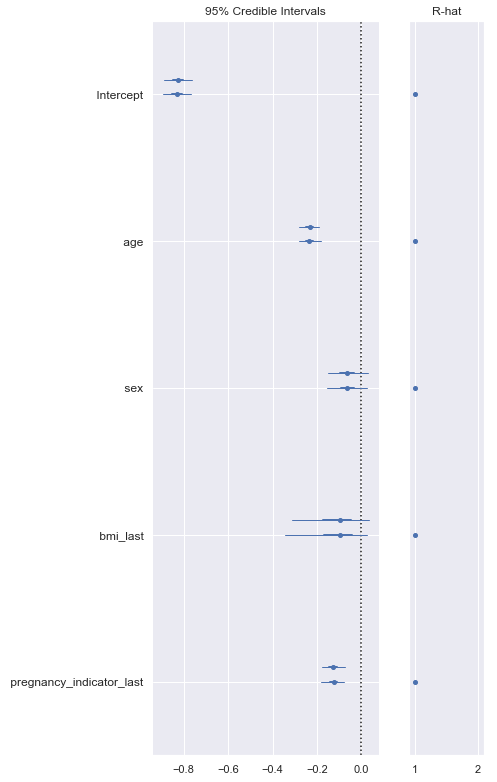

In [92]:
forestplot(simple_trace);

In [91]:
train.bmi_last.describe()

count    8.927000e+03
mean     3.979740e-19
std      1.000056e+00
min     -9.255603e-02
25%     -3.615372e-02
50%     -2.544412e-02
75%     -1.185584e-02
max      7.133194e+01
Name: bmi_last, dtype: float64

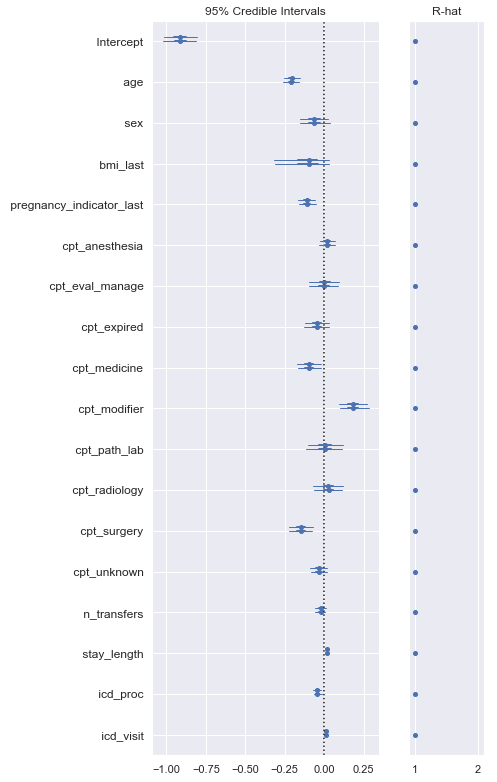

In [93]:
forestplot(visit_trace);

In [68]:
plt.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '#EAEAF2',
          'axes.formatter.limits': [-7, 7],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
        

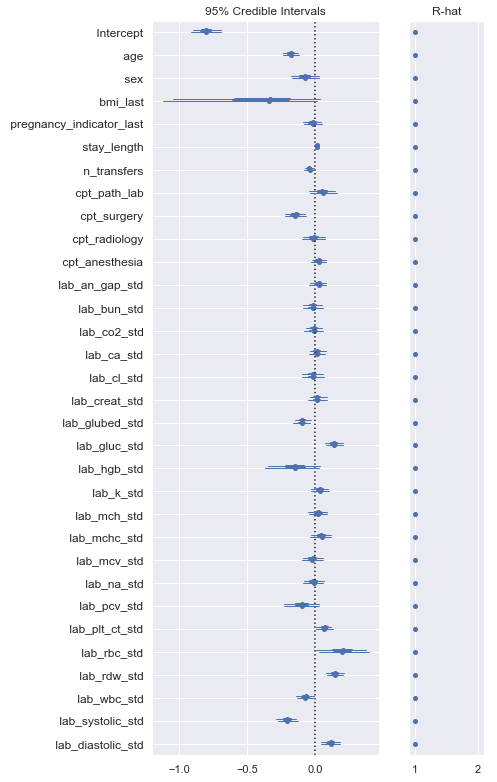

In [69]:
plt.rcParams['figure.figsize'] = [8,12]
forestplot(clinsignif_trace);

In [ ]:
# model validation
def validate_model():
    # in here we're going to use ppc to draw samples from the posterior vs data in the validation set
    # and then we'll see how well our model does
    pass

In [30]:
from pymc3 import forestplot, traceplot, autocorrplot, gelman_rubin, geweke, effective_n, energyplot, bfmi

In [88]:
# def plot_geweke(trace, varnames=['μ','δ'], intervals=15):
#     z = geweke(trace, intervals=intervals)
    
#     fig, ax = plt.subplots(1,2,figsize = [12,5], sharey = True)
#     ax[0].set_ylabel("z")
    
#     ncol = 2
    
#     for i in range(2):
#         for v in varnames:
#             x = z[i][v]
            
#             if len(x) == intervals:
#                 ax[i].scatter(*x.T, label = "{} (Chain {})".format(v,i))
                
#             if len(x) == 22:
#                 for j in range(22):
#                     ax[i].scatter(*x[j].T, label = "_nolegend_".format(v,j,i))
        
#         ax[i].legend(loc="best", ncol = ncol)
#         ax[i].set_title("Chain {}".format(i))
#         ax[i].hlines([-1,1], 0, 1000, linestyles='dotted')
#         ax[i].set_xlim(0, 1000);
    
#     return(z)

## Trying nonlinear terms --
BMI may have a quadratic association, age & sex interaction is a fairly common term to try in clinical outcome models.

However, it's difficult to specify quadratic terms in GLM--it doesn't seem to be working. So we'll leave this here for now. I suspect what I need to do is create the squared variables in the design matrix itself -- but that'll be a hassle for "new" data.

In [71]:
%%time
clinsignif_nonlinear_model, clinsignif_nonlinear_trace = model_gen(variables = demos + bmi + clinsignif + labs_var
                                                                   + ['bmi_last**2','age:sex','age**2'], draws = 1000)

logp = -4,616.7, ||grad|| = 1.3459: 100%|██████████| 98/98 [00:00<00:00, 446.96it/s]  
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [age:sex, lab_diastolic_std, lab_systolic_std, lab_wbc_std, lab_rdw_std, lab_rbc_std, lab_plt_ct_std, lab_pcv_std, lab_na_std, lab_mcv_std, lab_mchc_std, lab_mch_std, lab_k_std, lab_hgb_std, lab_gluc_std, lab_glubed_std, lab_creat_std, lab_cl_std, lab_ca_std, lab_co2_std, lab_bun_std, lab_an_gap_std, cpt_anesthesia, cpt_radiology, cpt_surgery, cpt_path_lab, n_transfers, stay_length, pregnancy_indicator_last, bmi_last, sex, age, Intercept]
Sampling 2 chains: 100%|██████████| 3000/3000 [01:14<00:00, 41.99draws/s]


CPU times: user 30.1 s, sys: 1.14 s, total: 31.2 s
Wall time: 1min 38s


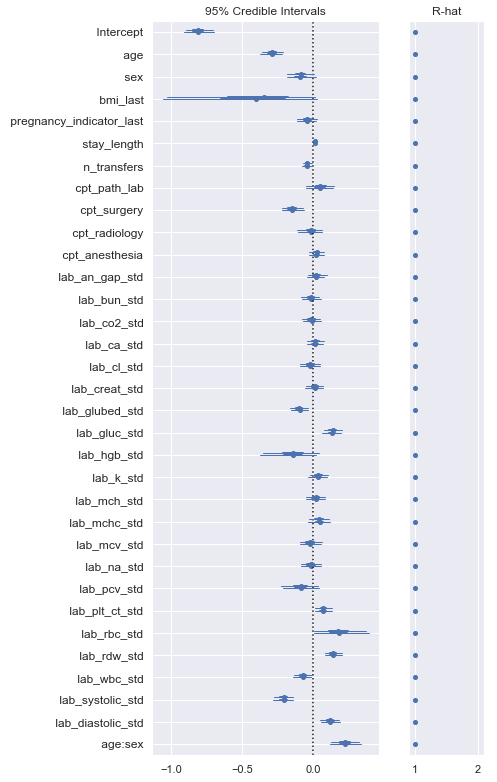

In [72]:
forestplot(clinsignif_nonlinear_trace);